In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import tools
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import iplot
%matplotlib inline
from textblob import TextBlob
import warnings
warnings.filterwarnings('ignore')

In [2]:
import nltk
import re
import string
from wordcloud import WordCloud,STOPWORDS
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from collections import Counter
from sklearn.utils import resample

In [3]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report,ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix,accuracy_score

In [4]:
df = pd.read_csv(r"C:\Users\Vipin Vashisth\Downloads\Reviews\Musical_instruments_reviews.csv")
df.shape

(10261, 9)

In [5]:
df.head(5)

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]","Not much to write about here, but it does exac...",5.0,good,1393545600,"02 28, 2014"
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",The product does exactly as it should and is q...,5.0,Jake,1363392000,"03 16, 2013"
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",The primary job of this device is to block the...,5.0,It Does The Job Well,1377648000,"08 28, 2013"
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",Nice windscreen protects my MXL mic and preven...,5.0,GOOD WINDSCREEN FOR THE MONEY,1392336000,"02 14, 2014"
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",This pop filter is great. It looks and perform...,5.0,No more pops when I record my vocals.,1392940800,"02 21, 2014"


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10261 entries, 0 to 10260
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   reviewerID      10261 non-null  object 
 1   asin            10261 non-null  object 
 2   reviewerName    10234 non-null  object 
 3   helpful         10261 non-null  object 
 4   reviewText      10254 non-null  object 
 5   overall         10261 non-null  float64
 6   summary         10261 non-null  object 
 7   unixReviewTime  10261 non-null  int64  
 8   reviewTime      10261 non-null  object 
dtypes: float64(1), int64(1), object(7)
memory usage: 721.6+ KB


In [7]:
df.describe()

,overall,unixReviewTime
count,10261.000000,1.026100e+04
mean,4.488744,1.360606e+09
std,0.894642,3.779735e+07
min,1.000000,1.095466e+09
25%,4.000000,1.343434e+09
50%,5.000000,1.368490e+09
75%,5.000000,1.388966e+09
max,5.000000,1.405987e+09


In [8]:
reviews = df.copy()
reviews.head()

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]","Not much to write about here, but it does exac...",5.0,good,1393545600,"02 28, 2014"
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",The product does exactly as it should and is q...,5.0,Jake,1363392000,"03 16, 2013"
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",The primary job of this device is to block the...,5.0,It Does The Job Well,1377648000,"08 28, 2013"
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",Nice windscreen protects my MXL mic and preven...,5.0,GOOD WINDSCREEN FOR THE MONEY,1392336000,"02 14, 2014"
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",This pop filter is great. It looks and perform...,5.0,No more pops when I record my vocals.,1392940800,"02 21, 2014"


In [9]:
print('The null values in the dataset:')
print("\n")
reviews.isnull().sum()

The null values in the dataset:




reviewerID         0
asin               0
reviewerName      27
helpful            0
reviewText         7
overall            0
summary            0
unixReviewTime     0
reviewTime         0
dtype: int64

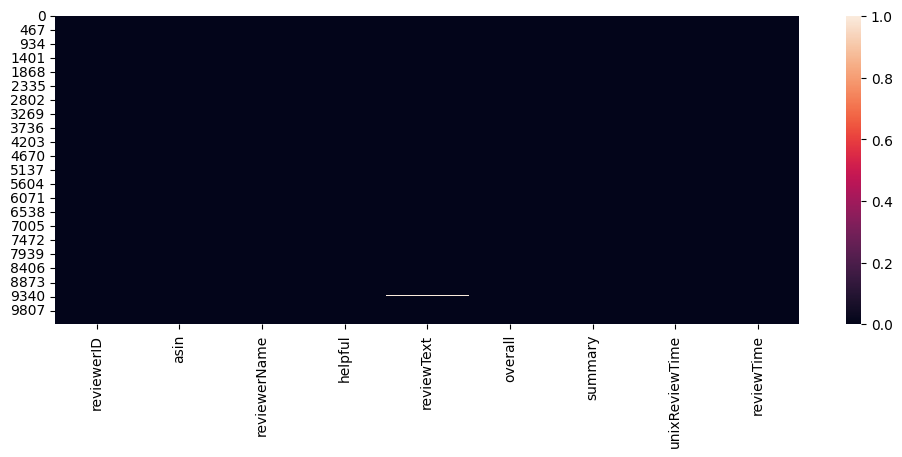

In [10]:
plt.figure(figsize=(12,4))
sns.heatmap(reviews.isnull())
plt.show()

In [11]:
reviews['reviewText'] = reviews['reviewText'].fillna("Missing")

In [12]:
reviews= reviews.dropna(subset=['reviewerName'])

In [13]:
reviews.isnull().sum()

reviewerID        0
asin              0
reviewerName      0
helpful           0
reviewText        0
overall           0
summary           0
unixReviewTime    0
reviewTime        0
dtype: int64

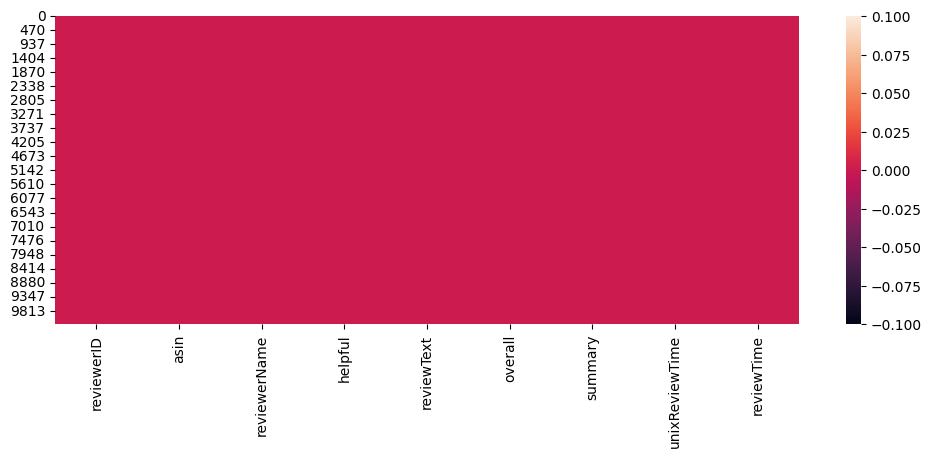

In [14]:
plt.figure(figsize=(12,4))
sns.heatmap(reviews.isnull())
plt.show()

In [15]:
reviews['reviews'] =reviews['reviewText']+reviews['summary'] 
reviews=reviews.drop(columns=['reviewText','summary'],axis=1)

In [16]:
reviews.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviewTime,reviews
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",5.0,1393545600,"02 28, 2014","Not much to write about here, but it does exac..."
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",5.0,1363392000,"03 16, 2013",The product does exactly as it should and is q...
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",5.0,1377648000,"08 28, 2013",The primary job of this device is to block the...
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",5.0,1392336000,"02 14, 2014",Nice windscreen protects my MXL mic and preven...
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",5.0,1392940800,"02 21, 2014",This pop filter is great. It looks and perform...


In [17]:
reviews.shape

(10234, 8)

In [18]:
reviews['reviews'][0]

"Not much to write about here, but it does exactly what it's supposed to. filters out the pop sounds. now my recordings are much more crisp. it is one of the lowest prices pop filters on amazon so might as well buy it, they honestly work the same despite their pricing,good"

In [19]:
reviews['overall'].value_counts()

overall
5.0    6918
4.0    2080
3.0     771
2.0     249
1.0     216
Name: count, dtype: int64

In [20]:
def sentiment(row):
    if row['overall'] == 3.0:
        return 'Neutral'
    elif row['overall'] > 3.0:
        return 'Positive'
    else :
        return 'Negative'

In [21]:
reviews['sentiment'] = reviews.apply(sentiment,axis=1)

In [22]:
print('Negative Sentiments : ',reviews[reviews['sentiment'] == 'Negative'].value_counts().sum())
print()
print('Positive Sentiments : ', reviews[reviews['sentiment'] == 'Positive'].value_counts().sum())
print()
print('Neutral Sentiments : ' ,reviews[reviews['sentiment'] == 'Neutral'].value_counts().sum())

Negative Sentiments :  465

Positive Sentiments :  8998

Neutral Sentiments :  771


### Handling Time Column

In [23]:
datetime  = reviews['reviewTime'].str.split(",",n=1,expand = True)
# datetime

In [24]:
month_date = datetime[0]
month_date = datetime[0].str.split(" ",n=1,expand=True)
reviews['month'] = month_date[0]
reviews['date']= month_date[1]
year = datetime[1]
reviews['year'] = datetime[1]

In [25]:
reviews=reviews.drop(columns='reviewTime',axis=1)

In [26]:
reviews.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviews,sentiment,month,date,year
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",5.0,1393545600,"Not much to write about here, but it does exac...",Positive,02,28,2014
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",5.0,1363392000,The product does exactly as it should and is q...,Positive,03,16,2013
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",5.0,1377648000,The primary job of this device is to block the...,Positive,08,28,2013
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",5.0,1392336000,Nice windscreen protects my MXL mic and preven...,Positive,02,14,2014
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",5.0,1392940800,This pop filter is great. It looks and perform...,Positive,02,21,2014


### Handling Helpful Reviews

In [27]:
reviews['helpful']

0          [0, 0]
1        [13, 14]
2          [1, 1]
3          [0, 0]
4          [0, 0]
           ...   
10256      [0, 0]
10257      [0, 0]
10258      [0, 0]
10259      [0, 0]
10260      [0, 0]
Name: helpful, Length: 10234, dtype: object

In [28]:
new=reviews['helpful'].str.split(",",n=1,expand = True)
new1 = new[0].str.split("[",n=1,expand=True)
new2=new[1].str.split("]",n=1,expand = True)
# new1
# ṇew2

In [29]:
new1=new1.reset_index(drop=True)
new2=new2.reset_index(drop=True)

In [30]:
new1=new1.drop([0],axis=1)
new2=new2.drop([1],axis=1)
# new1
# new2

In [31]:
helpful=pd.concat([new1,new2],axis=1)
# helpful

In [32]:
def trim(data):
    trim_strings = lambda x: x.strip() if isinstance(x,str) else x
    return data.applymap(trim_strings)

In [33]:
helpful= trim(helpful)
# helpful

In [34]:
helpful[0]=helpful[0].astype(str).astype(int)
helpful[1]=helpful[1].astype(str).astype(int)

In [35]:
helpful['result'] = helpful[1]/helpful[0]

In [36]:
helpful['result']=helpful['result'].fillna(0)
helpful['result'] =round(helpful['result'],2)
# helpful

In [37]:
reviews=reviews.drop(columns='helpful',axis=1)
reviews['helpful_reviews']=helpful['result']

In [38]:
reviews.head(5)

,reviewerID,asin,reviewerName,overall,unixReviewTime,reviews,sentiment,month,date,year,helpful_reviews
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...",5.0,1393545600,"Not much to write about here, but it does exac...",Positive,02,28,2014,0.00
1,A14VAT5EAX3D9S,1384719342,Jake,5.0,1363392000,The product does exactly as it should and is q...,Positive,03,16,2013,0.93
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""",5.0,1377648000,The primary job of this device is to block the...,Positive,08,28,2013,1.00
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""",5.0,1392336000,Nice windscreen protects my MXL mic and preven...,Positive,02,14,2014,0.00
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,5.0,1392940800,This pop filter is great. It looks and perform...,Positive,02,21,2014,0.00


In [39]:
reviews.shape

(10234, 11)

In [40]:
print(reviews['helpful_reviews'].value_counts().head())
print(reviews['helpful_reviews'].value_counts().tail())

helpful_reviews
0.00    7171
1.00    2034
0.50     265
0.67     136
0.75     111
Name: count, dtype: int64
helpful_reviews
0.56    1
0.15    1
0.13    1
0.43    1
0.69    1
Name: count, dtype: int64


### Handling Review Text Punctuation Cleaning

In [41]:
reviews['reviews'][456]

'I own three units capable of tremolo: Boss TR-2, Line 6 MM4, and the Boss SL-20 Slicer (like a tremolo on steroids). Plus my amp is a Twin Reverb so it too has tremolo. If you are unfamiliar, tremolo modulates the volume as if turning it up and down rapidly.The Boss TR-2 is the simplest of the three stompboxes to operate, with three controls: "Rate" of modulation, "Depth" of modulation (how much does the volume vary), and a "Wave" shape (jagged, square, or somewhere on a continuum in between). Unlike the other Boss stompboxes I own (CE-5 & PH-3), the TR-2 does not seem to compress sound so that it seems like you\'re "playing in a fishbowl" (as another reviewer puts it).The "Wave" control is what gives the unit its sonic versatility, so it is a nice feature to have. Most tremolos have it, but not all. For the price, it can give you a decent set of classic tremolo sounds with nothing too crazy. It is the unit that Tom Morello uses on "Guerilla Radio," and it does well with tremolo class

In [42]:
def reviews_cleaner(text):
    text = str(text).lower()
    text= re.sub('\[.*?/""]','',text)
    text=re.sub('https?://\S+|www\.\S+','',text)
    text = re.sub('<.*?>+','',text)
    text= re.sub('[%s]' % re.escape(string.punctuation),'',text)
    text =re.sub('\n','',text)
    text = re.sub('\w*\d\w*', '', text)
    
    return text
# reviews_cleaner(reviews['reviews'][456])

In [43]:
reviews['reviews'] = reviews['reviews'].apply(lambda x: reviews_cleaner(x))

In [44]:
reviews['reviews'][456]

'i own three units capable of tremolo boss  line   and the boss  slicer like a tremolo on steroids plus my amp is a twin reverb so it too has tremolo if you are unfamiliar tremolo modulates the volume as if turning it up and down rapidlythe boss  is the simplest of the three stompboxes to operate with three controls rate of modulation depth of modulation how much does the volume vary and a wave shape jagged square or somewhere on a continuum in between unlike the other boss stompboxes i own    the  does not seem to compress sound so that it seems like youre playing in a fishbowl as another reviewer puts itthe wave control is what gives the unit its sonic versatility so it is a nice feature to have most tremolos have it but not all for the price it can give you a decent set of classic tremolo sounds with nothing too crazy it is the unit that tom morello uses on guerilla radio and it does well with tremolo classics like the smiths how soon is now i hear no volume drop problem like other 

### Removal of StopWords

In [45]:
stop_words = set(STOPWORDS)

In [46]:
def stopword(text):
    filtered_words = [word for word in text.split() if word.lower() not in stop_words]
    return filtered_words

In [47]:
# stopword(reviews['reviews'][456])

In [48]:
reviews['reviews']=reviews['reviews'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

In [49]:
reviews.head()

,reviewerID,asin,reviewerName,overall,unixReviewTime,reviews,sentiment,month,date,year,helpful_reviews
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...",5.0,1393545600,much write exactly supposed filters pop sounds...,Positive,02,28,2014,0.00
1,A14VAT5EAX3D9S,1384719342,Jake,5.0,1363392000,product exactly quite affordablei realized dou...,Positive,03,16,2013,0.93
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""",5.0,1377648000,primary job device block breath produce poppin...,Positive,08,28,2013,1.00
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""",5.0,1392336000,nice windscreen protects mxl mic prevents pops...,Positive,02,14,2014,0.00
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,5.0,1392940800,pop filter great looks performs studio filter ...,Positive,02,21,2014,0.00


### Data Visualization 

In [50]:
df = pd.DataFrame(reviews.groupby('sentiment')['helpful_reviews'].mean())
df

,helpful_reviews
sentiment,
Negative,0.295431
Neutral,0.260806
Positive,0.263034


In [51]:
import plotly.express as pt
fig=pt.violin(data_frame = reviews, x='sentiment',y='helpful_reviews')
fig.show()

Year and Sentiment Count

In [52]:
year_senti_count=reviews.groupby(['year','sentiment'])['sentiment'].count().unstack()
year_senti_count

sentiment,Negative,Neutral,Positive
year,,,
2004,NaN,NaN,7.0
2005,NaN,NaN,4.0
2006,1.0,1.0,8.0
2007,1.0,NaN,21.0
2008,2.0,7.0,54.0
2009,5.0,8.0,115.0
2010,16.0,20.0,314.0
2011,46.0,84.0,876.0
2012,85.0,130.0,1720.0


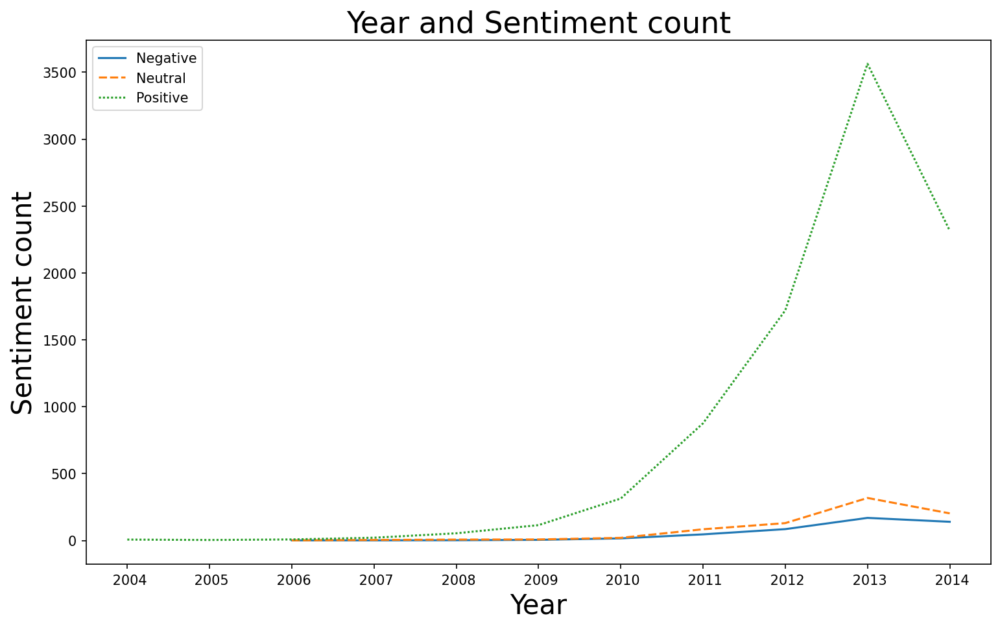

In [53]:
plt.figure(figsize = (12,7),dpi=150)
sns.lineplot(data=year_senti_count)
plt.title('Year and Sentiment count',fontsize=22)
plt.xlabel('Year',fontsize=20)
plt.ylabel('Sentiment count',fontsize=20)
plt.legend()
plt.show()

Month vs Reviews count

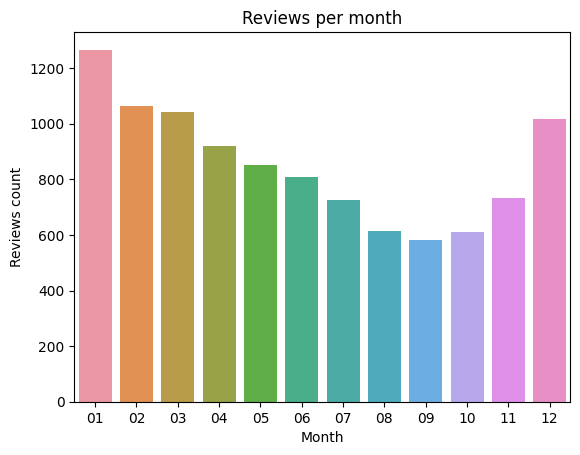

In [54]:
month_review_count = pd.DataFrame(reviews.groupby(['month'])['reviews'].count()).reset_index()
sns.barplot(data=month_review_count,x='month',y='reviews')
plt.title("Reviews per month")
plt.xlabel("Month")
plt.ylabel("Reviews count")
plt.show()

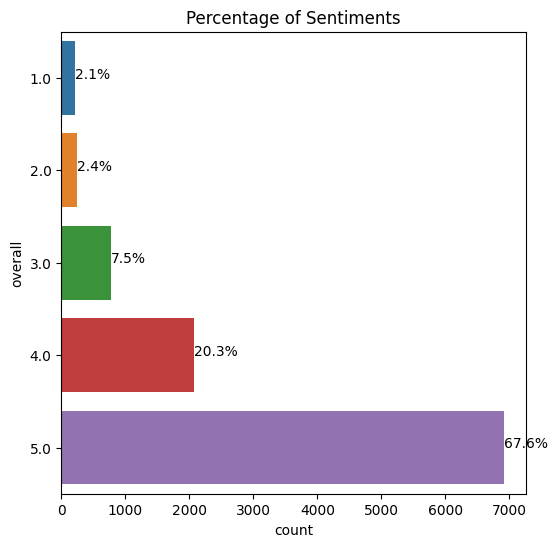

In [55]:
plt.figure(figsize=(6,6))
plt.title('Percentage of Sentiments')
ax = sns.countplot(y = 'overall', data = reviews)
total = len(reviews)
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

In [56]:
reviews['polarity']=reviews['reviews'].map(lambda text : TextBlob(text).sentiment.polarity)

In [57]:
reviews['polarity']=round(reviews['polarity'],2)

In [58]:
reviews['reviews_length']= reviews['reviews'].astype(str).apply(len)
reviews['reviews_word_count'] = reviews['reviews'].apply(lambda review : len(str(review).split()))

In [59]:
reviews.head()

,reviewerID,asin,reviewerName,overall,unixReviewTime,reviews,sentiment,month,date,year,helpful_reviews,polarity,reviews_length,reviews_word_count
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...",5.0,1393545600,much write exactly supposed filters pop sounds...,Positive,02,28,2014,0.00,0.32,158,24
1,A14VAT5EAX3D9S,1384719342,Jake,5.0,1363392000,product exactly quite affordablei realized dou...,Positive,03,16,2013,0.93,0.01,340,52
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""",5.0,1377648000,primary job device block breath produce poppin...,Positive,08,28,2013,1.00,0.17,293,44
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""",5.0,1392336000,nice windscreen protects mxl mic prevents pops...,Positive,02,14,2014,0.00,0.33,169,22
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,5.0,1392940800,pop filter great looks performs studio filter ...,Positive,02,21,2014,0.00,0.80,128,19


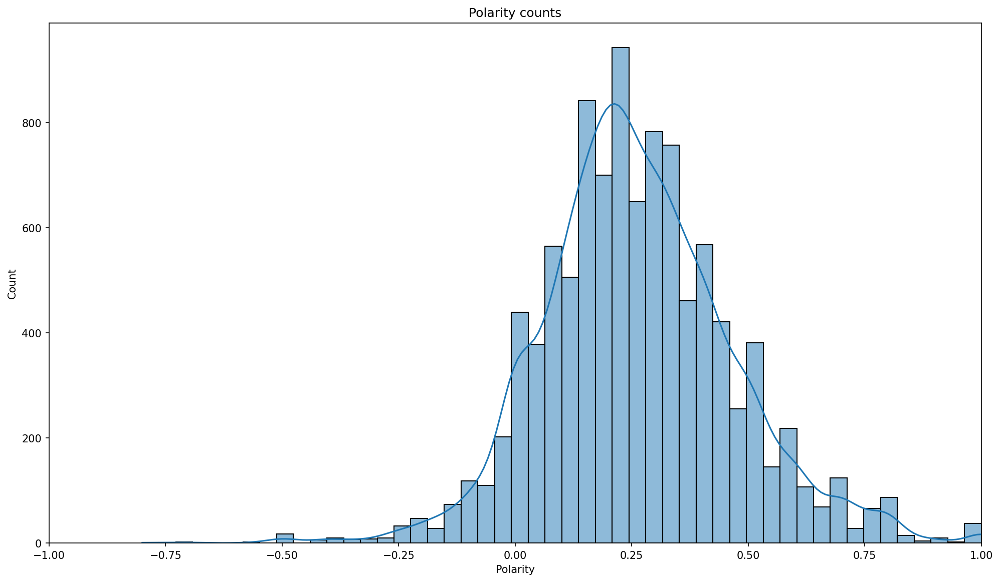

In [60]:
plt.figure(figsize= (16,9),dpi=150)
sns.histplot(data=reviews , x='polarity',kde= True,bins=50)
plt.xlabel("Polarity")
plt.xlim(-1,1)
plt.ylabel("Count")
plt.title("Polarity counts")
plt.show()

In [61]:
fig=px.histogram(reviews['reviews_word_count'],nbins=150,color=reviews['sentiment'])
fig.update_layout(xaxis_title='Polarity',yaxis_title='Count',title='Review Length Distribution')
fig.show()

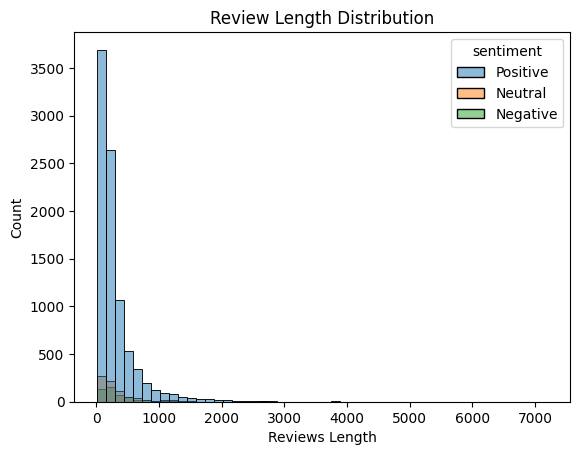

In [62]:
sns.histplot(data = reviews , x='reviews_length',bins=50,hue='sentiment')
plt.xlabel("Reviews Length")
plt.ylabel("Count")
plt.title("Review Length Distribution")
plt.show()

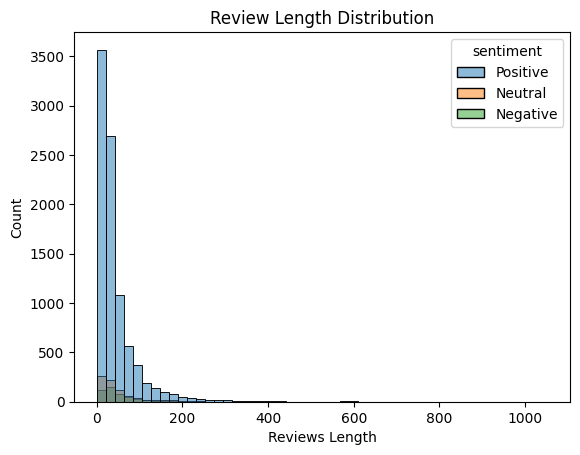

In [63]:
sns.histplot(data = reviews , x='reviews_word_count',bins=50,hue='sentiment')
plt.xlabel("Reviews Length")
plt.ylabel("Count")
plt.title("Review Length Distribution")
plt.show()

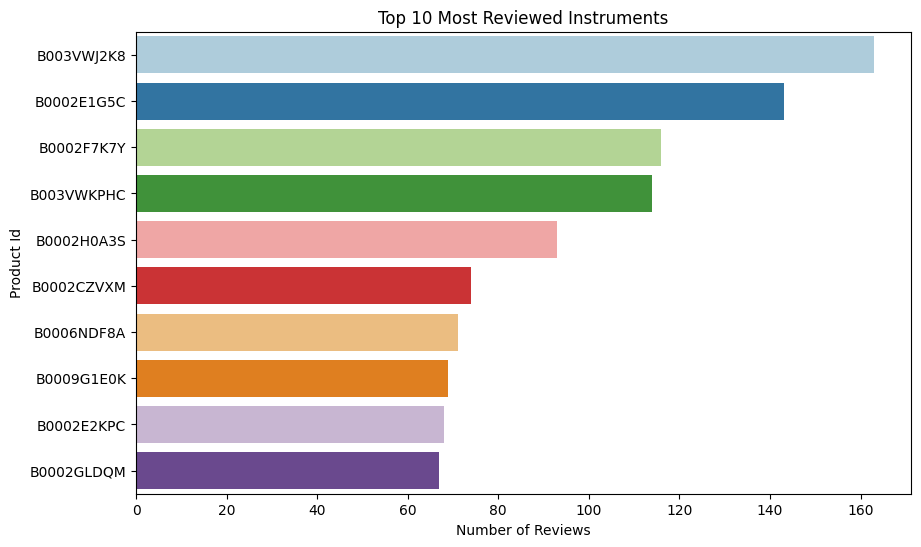

In [64]:
# Group by asin and count unique reviewer_id
asin_counts = reviews.groupby('asin')['reviewerID'].nunique()

# Get top 10 most reviewed instruments
top_asin_counts = asin_counts.nlargest(10)

# Create a DataFrame for plotting
top_asin_df = pd.DataFrame({'asin': top_asin_counts.index, 'cnt': top_asin_counts.values})

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x='cnt', y='asin', data=top_asin_df, palette="Paired")
plt.xlabel("Number of Reviews")
plt.ylabel("Product Id")
plt.title("Top 10 Most Reviewed Instruments")
plt.show()


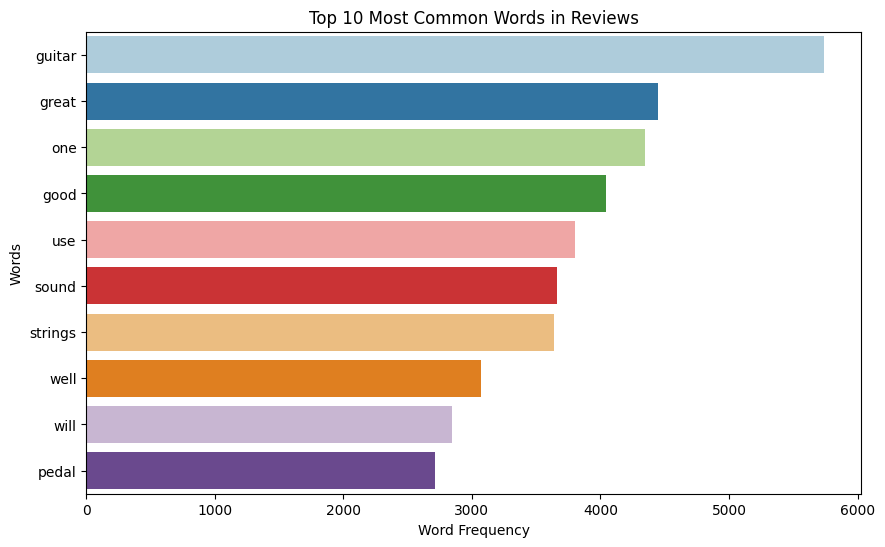

In [65]:
reviews['full_text'] = reviews['reviews']

# Tokenize the full_text and remove stop words
instruments_review = pd.DataFrame({'word': reviews['full_text'].str.split()}).explode('word')

# Convert the set of stop words to a list
stop_words_list = list(stop_words)

# Filter out stop words from the word list
instruments_review = instruments_review[~instruments_review['word'].isin(stop_words_list)]

# Count word frequency and create a DataFrame for plotting
word_counts = instruments_review['word'].value_counts().head(10)
top_words_df = pd.DataFrame({'word': word_counts.index, 'count': word_counts.values})

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x='count', y='word', data=top_words_df, palette='Paired')
plt.xlabel('Word Frequency')
plt.ylabel('Words')
plt.title('Top 10 Most Common Words in Reviews')
plt.show()


In [66]:
instruments_review=instruments_review.reset_index()
reviews['word']=instruments_review['word']

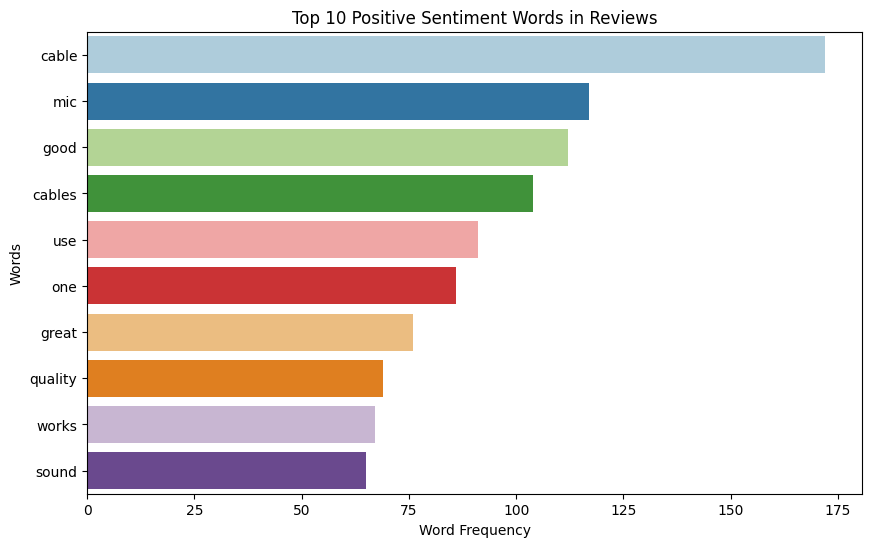

In [67]:
# Filter positive sentiment, count word frequency, and create a DataFrame for plotting
positive_review = reviews[reviews["sentiment"]=='Positive'].dropna()
positive_sentiment_word_counts = positive_review['word'].value_counts().head(10)
top_positive_words_df = pd.DataFrame({'word': positive_sentiment_word_counts.index, 'count': positive_sentiment_word_counts.values})

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x='count', y='word', data=top_positive_words_df, palette='Paired')
plt.xlabel('Word Frequency')
plt.ylabel('Words')
plt.title('Top 10 Positive Sentiment Words in Reviews')
plt.show()

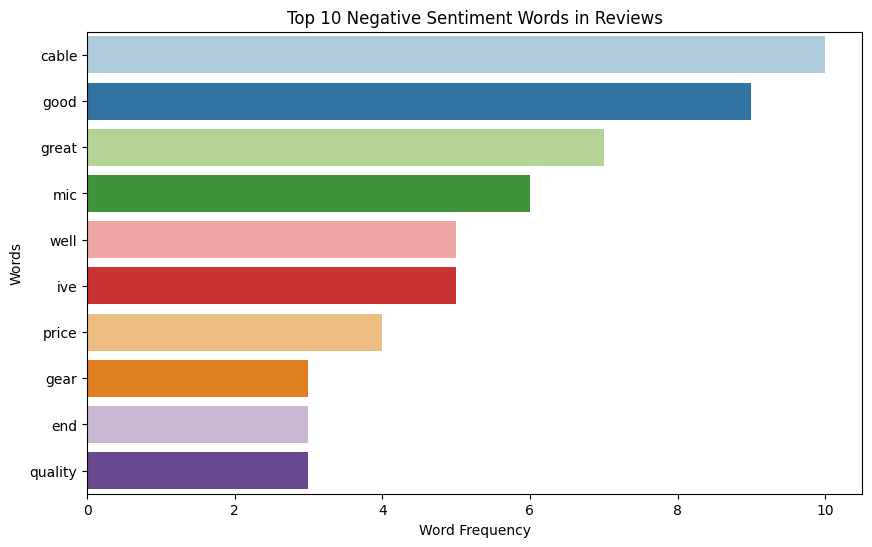

In [68]:
# Filter positive sentiment, count word frequency, and create a DataFrame for plotting
negative_review = reviews[reviews["sentiment"]=='Negative'].dropna()
negative_sentiment_word_counts = negative_review['word'].value_counts().head(10)
top_negative_words_df = pd.DataFrame({'word': negative_sentiment_word_counts.index, 'count': negative_sentiment_word_counts.values})

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x='count', y='word', data=top_negative_words_df, palette='Paired')
plt.xlabel('Word Frequency')
plt.ylabel('Words')
plt.title('Top 10 Negative Sentiment Words in Reviews')
plt.show()

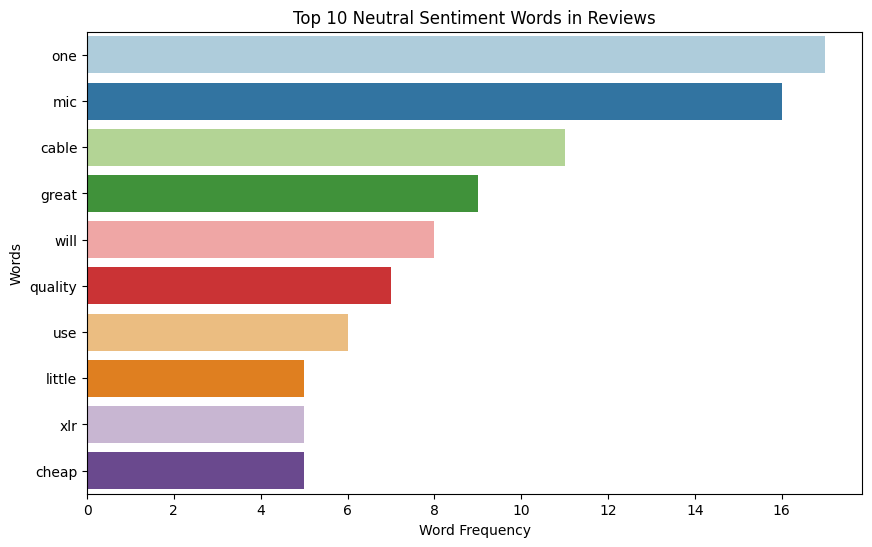

In [69]:
# Filter positive sentiment, count word frequency, and create a DataFrame for plotting
neutral_review = reviews[reviews["sentiment"]=='Neutral'].dropna()
neutral_sentiment_word_counts = neutral_review['word'].value_counts().head(10)
top_neutral_words_df = pd.DataFrame({'word': neutral_sentiment_word_counts.index, 'count': neutral_sentiment_word_counts.values})

# Create the bar plot using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x='count', y='word', data=top_neutral_words_df, palette='Paired')
plt.xlabel('Word Frequency')
plt.ylabel('Words')
plt.title('Top 10 Neutral Sentiment Words in Reviews')
plt.show()

In [70]:
negative_review['word'].value_counts().head()

word
cable    10
good      9
great     7
mic       6
well      5
Name: count, dtype: int64

### Review Text Wordcloud

In [71]:
positive_review = reviews[reviews["sentiment"]=='Positive'].dropna()
neutral_review = reviews[reviews["sentiment"]=='Neutral'].dropna()
negative_review = reviews[reviews["sentiment"]=='Negative'].dropna()

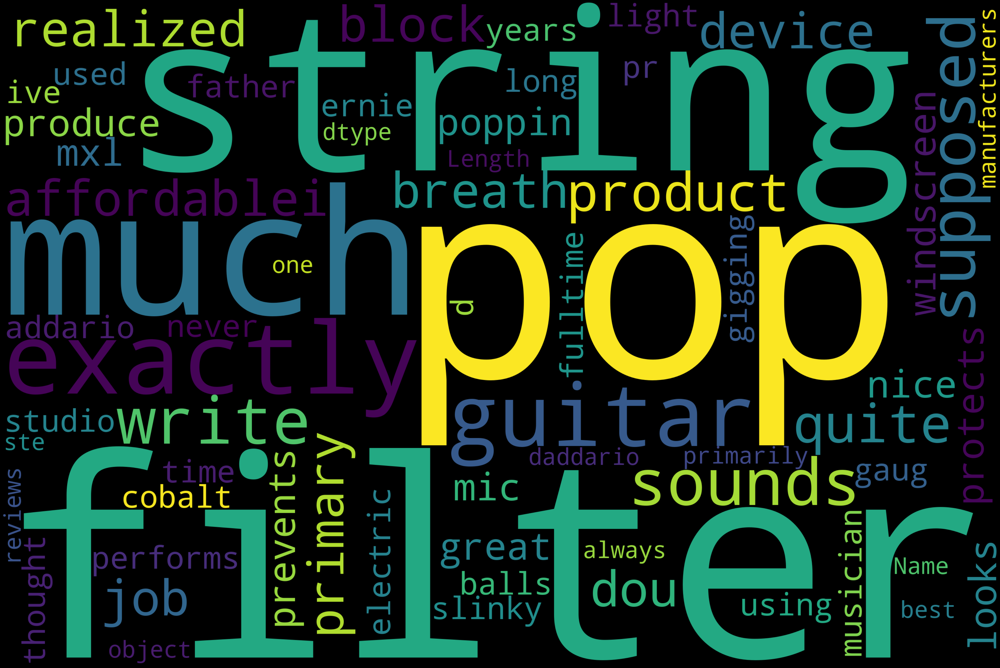

In [72]:
text = positive_review["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Negative_reviews 

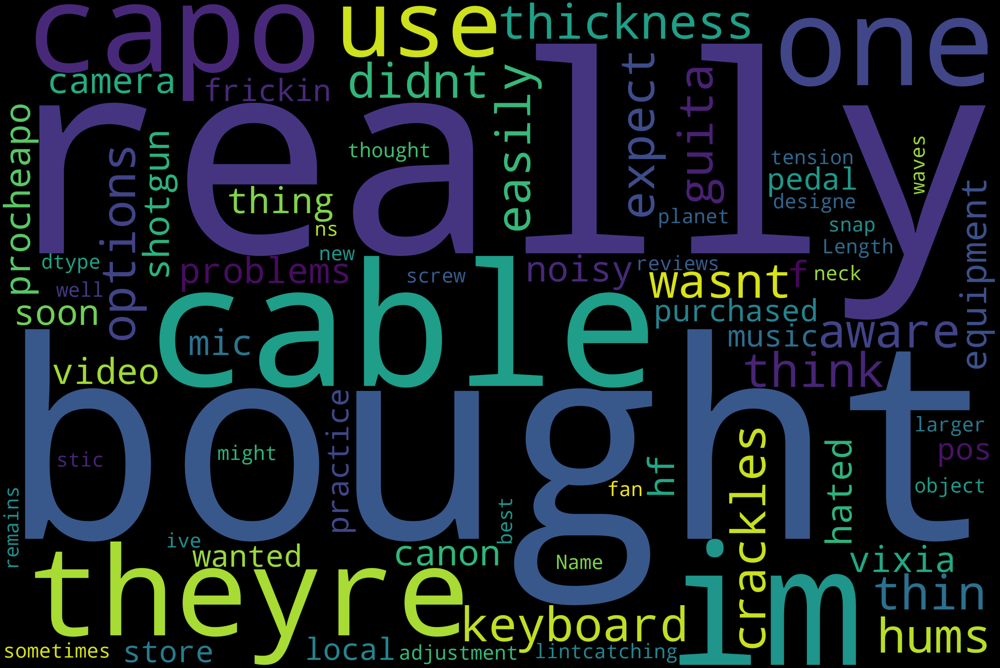

In [73]:
text = negative_review["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Neutral Reviews

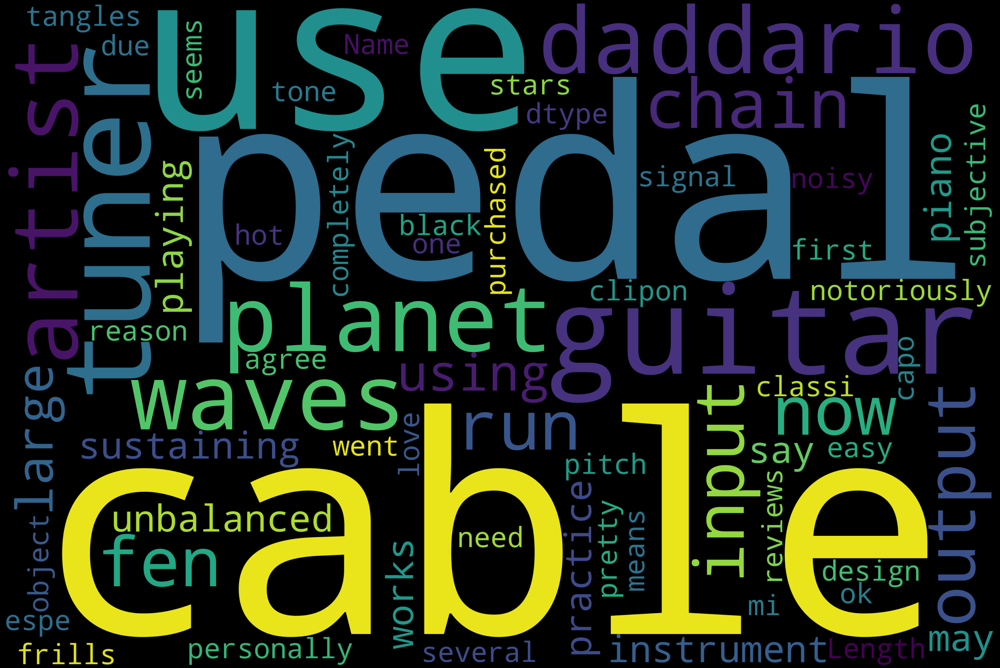

In [74]:
text = neutral_review["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### Label Encoding

In [75]:
from sklearn.preprocessing import LabelEncoder

In [76]:
label = LabelEncoder()

In [77]:
reviews['Sentiment']= label.fit_transform(reviews['sentiment']) 

reviews['Sentiment'].unique() 

array([2, 1, 0])

In [78]:
reviews['Sentiment'].value_counts()

Sentiment
2    8998
1     771
0     465
Name: count, dtype: int64

In [79]:
review_features = reviews.copy()
review_features = review_features[['reviews']].reset_index(drop=True)
review_features['reviews'][3]

'nice windscreen protects mxl mic prevents pops thing gooseneck marginally able hold screen position requires careful positioning clamp avoid sagginggood windscreen money'

In [80]:
tfidf_vectorizer = TfidfVectorizer(max_features = 5000, ngram_range = (2,2))
# TF-IDF feature matrix
X = tfidf_vectorizer.fit_transform(review_features['reviews'])
X.shape

(10234, 5000)

In [81]:
y=reviews['Sentiment']
y.shape

(10234,)

In [82]:
from sklearn.datasets import make_classification
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

In [83]:
print("Original dataset shape:", Counter(y))

Original dataset shape: Counter({2: 8998, 1: 771, 0: 465})


In [84]:
print("Original dataset shape:", Counter(y))

# Random Oversampling
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)

print("Random Oversampling dataset shape:", Counter(y_resampled))

# # Random Undersampling
# rus = RandomUnderSampler(random_state=42)
# X_resampled, y_resampled = rus.fit_resample(X, y)
# print("Random undersampling dataset shape:", Counter(y_resampled))

Original dataset shape: Counter({2: 8998, 1: 771, 0: 465})
Random Oversampling dataset shape: Counter({2: 8998, 1: 8998, 0: 8998})


In [85]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.25, random_state=42)

### Model Building
#### 1) Logistic Regression

In [86]:
scaler = StandardScaler(with_mean=False)
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [87]:
logreg = LogisticRegression()

y_pred : [1 0 2 ... 1 0 0]
Classification Report:
              precision    recall  f1-score   support

           0       0.89      1.00      0.94      2245
           1       0.88      0.96      0.92      2229
           2       1.00      0.79      0.88      2275

    accuracy                           0.92      6749
   macro avg       0.92      0.92      0.91      6749
weighted avg       0.92      0.92      0.91      6749

Accuracy: 0.9162838939102089


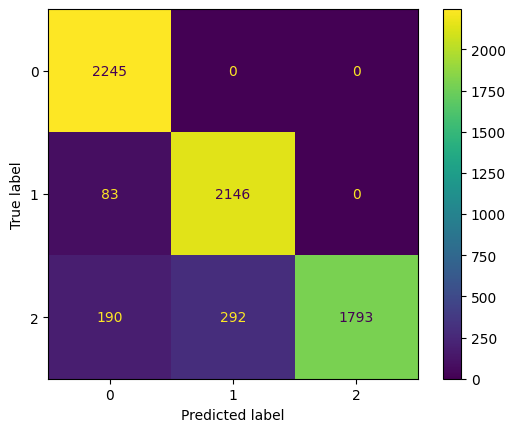

In [88]:
logreg.fit(X_train_scaled, y_train)
y_pred = logreg.predict(X_test_scaled)

#Prediction
print("y_pred :",y_pred)

#Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred))

#Accuracy Score
accuracy_score=accuracy_score(y_test,y_pred)
print("Accuracy:", accuracy_score)

#Confusion Matrix
log_confusion_matrix=confusion_matrix(y_test,y_pred)
log_confusion_matrix

#Display Confusion Matrix
cm = confusion_matrix(y_test,y_pred)
con_disp=ConfusionMatrixDisplay(confusion_matrix=cm)
con_disp.plot()
plt.show()

#### 2)Random Forest Classifier

Accuracy: 0.9594013927989332
Classification Report:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95      2245
           1       0.97      0.96      0.97      2229
           2       1.00      0.92      0.96      2275

    accuracy                           0.96      6749
   macro avg       0.96      0.96      0.96      6749
weighted avg       0.96      0.96      0.96      6749



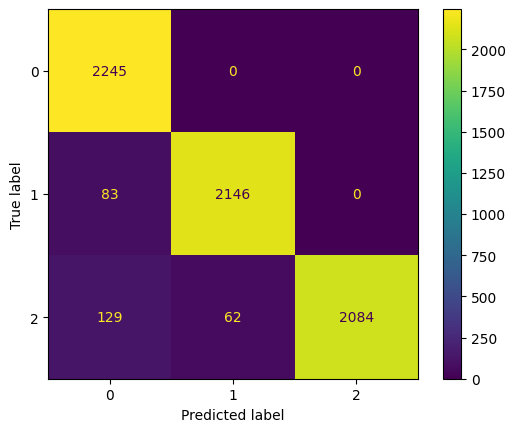

In [89]:
from sklearn.metrics import accuracy_score
#StandardScaler
scaler = StandardScaler(with_mean = False)

# Fit the scaler on the training data and transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100,max_features = 'log2', random_state=42,criterion='entropy')
rf_classifier.fit(X_train_scaled, y_train)

# Predictions
y_pred = rf_classifier.predict(X_test_scaled)

# Accuracy
rfc_acc_score = accuracy_score(y_test, y_pred)
print("Accuracy:", rfc_acc_score)

#Confusion Matrix
rfc_confusion_matrix=confusion_matrix(y_test,y_pred)
rfc_confusion_matrix

# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Display Confusion Matrix
cm =confusion_matrix(y_test,y_pred)
con_disp=ConfusionMatrixDisplay(confusion_matrix=cm)
con_disp.plot()
plt.show()

#### 3)Bernoulli-NB

Accuracy: 0.8500518595347459
[[2155   58   32]
 [ 289 1822  118]
 [ 231  284 1760]]
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.96      0.88      2245
           1       0.84      0.82      0.83      2229
           2       0.92      0.77      0.84      2275

    accuracy                           0.85      6749
   macro avg       0.86      0.85      0.85      6749
weighted avg       0.86      0.85      0.85      6749



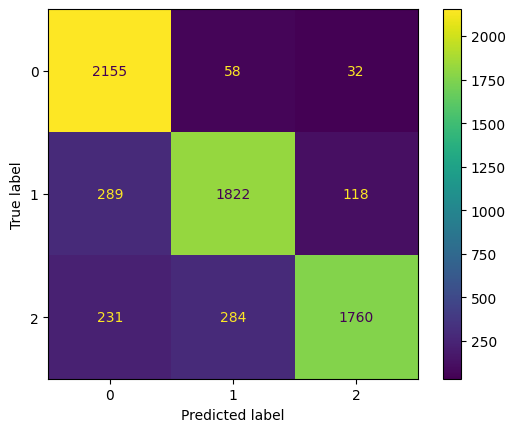

In [90]:
# StandardScaler
scaler = StandardScaler(with_mean=False)

# Fit the scaler on the training data and transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#  Bernoulli Naive Bayes classifier
nb_classifier = BernoulliNB(force_alpha=True)
nb_classifier.fit(X_train_scaled, y_train)

# Predictions
y_pred = nb_classifier.predict(X_test_scaled)

# Accuracy
nb_acc_score = accuracy_score(y_test, y_pred)
print("Accuracy:", nb_acc_score)

#Confusion Matrix
nb_confusion_matrix=confusion_matrix(y_test,y_pred)
print(nb_confusion_matrix)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Display Confusion Matrix
cm =confusion_matrix(y_test,y_pred)
con_disp=ConfusionMatrixDisplay(confusion_matrix=cm)
con_disp.plot()
plt.show()

#### 4) KNeighborsClassifier 

Accuracy: 0.8478293080456364
Confusion Matrix:
[[2242    0    3]
 [  83 2142    4]
 [ 804  133 1338]]
Classification Report:
              precision    recall  f1-score   support

           0       0.72      1.00      0.83      2245
           1       0.94      0.96      0.95      2229
           2       0.99      0.59      0.74      2275

    accuracy                           0.85      6749
   macro avg       0.88      0.85      0.84      6749
weighted avg       0.88      0.85      0.84      6749



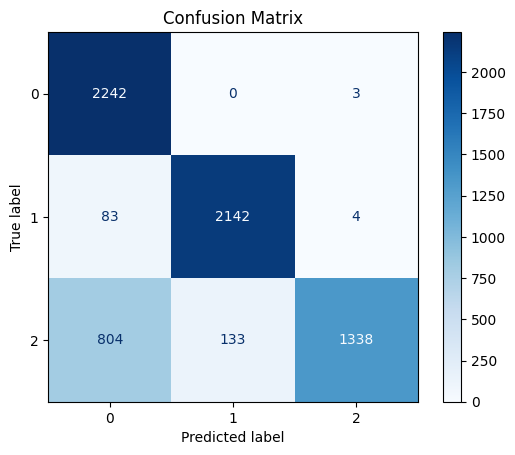

In [91]:
# StandardScaler
scaler = StandardScaler(with_mean=False)

# Fit the scaler on the training data and transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# KNeighborsClassifier
knn_classifier = KNeighborsClassifier(n_neighbors=3)  # You can adjust the number of neighbors
knn_classifier.fit(X_train_scaled, y_train)

# Predictions
y_pred = knn_classifier.predict(X_test_scaled)

# Accuracy
knn_acc_score = accuracy_score(y_test, y_pred)
print("Accuracy:", knn_acc_score)

# Confusion Matrix
knn_confusion_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(knn_confusion_matrix)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Display Confusion Matrix
con_disp = ConfusionMatrixDisplay(confusion_matrix=knn_confusion_matrix)
con_disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

#### 5)SVC

Accuracy: 0.9607349236923989
Confusion Matrix:
[[2239    6    0]
 [  87 2142    0]
 [ 101   71 2103]]
Classification Report:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96      2245
           1       0.97      0.96      0.96      2229
           2       1.00      0.92      0.96      2275

    accuracy                           0.96      6749
   macro avg       0.96      0.96      0.96      6749
weighted avg       0.96      0.96      0.96      6749



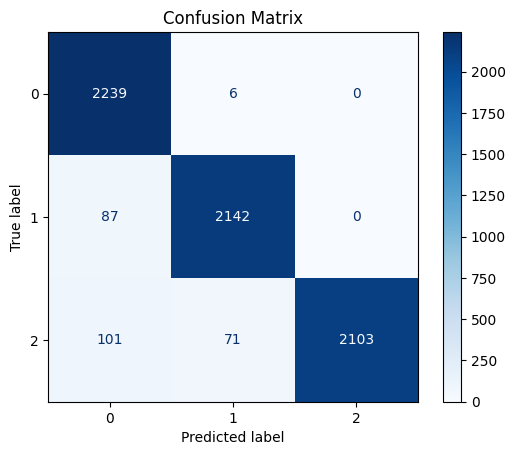

In [92]:
# StandardScaler
scaler = StandardScaler(with_mean=False)

# Fit the scaler on the training data and transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# SVC Classifier
svc_classifier = SVC(kernel='rbf', C=1.0)  # You can adjust the kernel and C parameter
svc_classifier.fit(X_train_scaled, y_train)

# Predictions
y_pred = svc_classifier.predict(X_test_scaled)

# Accuracy
svc_acc_score = accuracy_score(y_test, y_pred)
print("Accuracy:", svc_acc_score)

# Confusion Matrix
svc_confusion_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(svc_confusion_matrix)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Display Confusion Matrix
con_disp = ConfusionMatrixDisplay(confusion_matrix=svc_confusion_matrix)
con_disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

### Saving Best Model

In [93]:
import joblib

In [94]:
joblib.dump(svc_classifier,r'C:\Users\Vipin Vashisth\Downloads\models\svc_classifier.sav')

['C:\\Users\\Vipin Vashisth\\Downloads\\models\\svc_classifier.sav']

In [95]:
model=joblib.load(r'C:\Users\Vipin Vashisth\Downloads\models\svc_classifier.sav')

In [96]:
model

SVC()

### SVC has Highest Accuracy Score

In [97]:
svc_acc_score = accuracy_score(y_test, y_pred)
print("Accuracy:", svc_acc_score)

Accuracy: 0.9607349236923989
